# **Fetching data from google drive**

In [ ]:
from google.colab import drive 
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
%cd /content/drive/My\ Drive/

/content/drive/My Drive


In [ ]:
%cd YOLO_colab/detection_tracking/

/content/drive/My Drive/YOLO_colab/detection_tracking


In [ ]:
!pwd

/content/drive/My Drive/YOLO_colab/detection_tracking


# **Import the libraries**

In [ ]:
import os
import time
import cv2
import numpy as np
from model.yolo_model import YOLO
from google.colab.patches import cv2_imshow

# **Functions for object detection**

Function for processing image

In [ ]:
def process_image(img):
    """Resize, reduce and expand image.

    # Argument:
        img: original image.

    # Returns
        image: ndarray(64, 64, 3), processed image.
    """
    image = cv2.resize(img, (416, 416),
                       interpolation=cv2.INTER_CUBIC)
    image = np.array(image, dtype='float32')
    image /= 255.
    image = np.expand_dims(image, axis=0)

    return image

Function for fetching coco classes

In [ ]:
def get_classes(file):
    """Get classes name.

    # Argument:
        file: classes name for database.

    # Returns
        class_names: List, classes name.

    """
    with open(file) as f:
        class_names = f.readlines()
    class_names = [c.strip() for c in class_names]

    return class_names

Function to draw rectangle when object detected

In [ ]:
def draw(image, boxes, scores, classes, all_classes):
    """Draw the boxes on the image.

    # Argument:
        image: original image.
        boxes: ndarray, boxes of objects.
        classes: ndarray, classes of objects.
        scores: ndarray, scores of objects.
        all_classes: all classes name.
    """
    for box, score, cl in zip(boxes, scores, classes):
        x, y, w, h = box

        top = max(0, np.floor(x + 0.5).astype(int))
        left = max(0, np.floor(y + 0.5).astype(int))
        right = min(image.shape[1], np.floor(x + w + 0.5).astype(int))
        bottom = min(image.shape[0], np.floor(y + h + 0.5).astype(int))

        cv2.rectangle(image, (top, left), (right, bottom), (255, 0, 0), 2)
        cv2.putText(image, '{0} {1:.2f}'.format(all_classes[cl], score),
                    (top, left - 6),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, (0, 0, 255), 1,
                    cv2.LINE_AA)

        print('class: {0}, score: {1:.2f}'.format(all_classes[cl], score))
        print('box coordinate x,y,w,h: {0}'.format(box))

    print()

Function for detecting objects in image

In [ ]:
def detect_image(image, yolo, all_classes):
    """Use yolo v3 to detect images.

    # Argument:
        image: original image.
        yolo: YOLO, yolo model.
        all_classes: all classes name.

    # Returns:
        image: processed image.
    """
    pimage = process_image(image)

    start = time.time()
    boxes, classes, scores = yolo.predict(pimage, image.shape)
    end = time.time()

    print('time: {0:.2f}s'.format(end - start))

    if boxes is not None:
        draw(image, boxes, scores, classes, all_classes)

    return image

# **Fetching coco classes**

In [ ]:
yolo = YOLO(0.6, 0.5)
file = 'data/coco_classes.txt'
all_classes = get_classes(file)

In [ ]:
!pwd

/content/drive/My Drive/YOLO_colab/detection_tracking


In [ ]:
%cd images/test/

/content/drive/My Drive/YOLO_colab/detection_tracking/images/test


# **Detecting objects in images through webcam**

In [ ]:
name = input("Enter file name : ")

Enter file name : soniya1.jpg


In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename=name, quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

Saved to soniya1.jpg


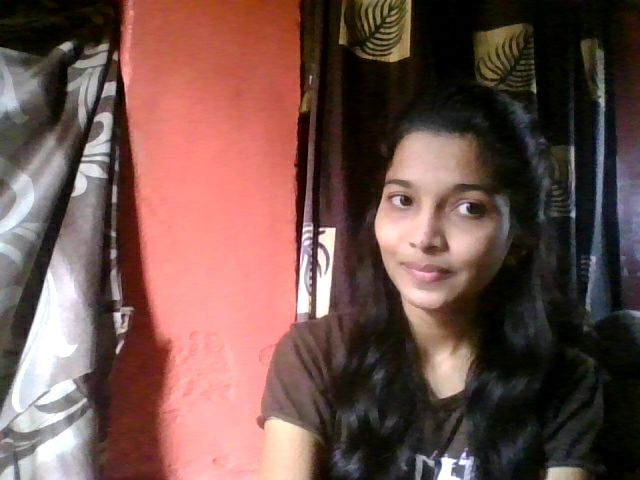

In [ ]:
from IPython.display import Image
try:
  filename = take_photo(name)
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
%cd ..

/content/drive/My Drive/YOLO_colab/detection_tracking/images


In [ ]:
%cd ..

/content/drive/My Drive/YOLO_colab/detection_tracking


time: 2.40s
class: person, score: 1.00
box coordinate x,y,w,h: [242.51354218  67.97568798 376.59873962 411.14407539]



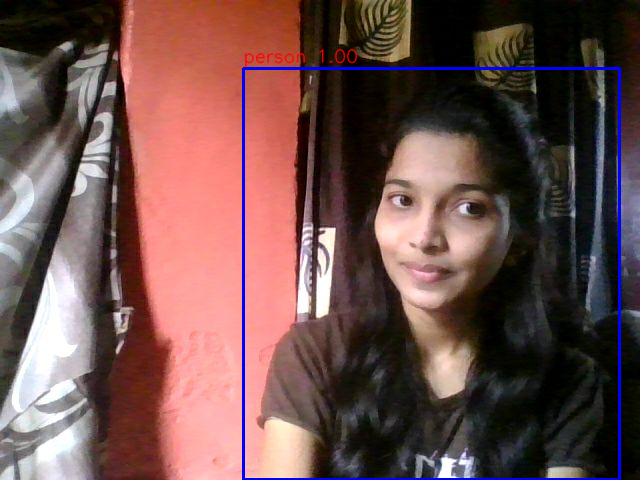

True

In [ ]:
f = name
path = '/content/drive/My Drive/YOLO_colab/detection_tracking/images/test/'+f
image = cv2.imread(path)
image = detect_image(image, yolo, all_classes)
cv2_imshow(image)
cv2.imwrite('/content/drive/My Drive/YOLO_colab/detection_tracking/images/res/' + f, image)

# **Detecting objects in images**

Enter file name : talking.jpg
time: 1.27s
class: person, score: 0.99
box coordinate x,y,w,h: [2748.0686903  1118.93985033  797.72356749 1674.61311117]
class: person, score: 0.96
box coordinate x,y,w,h: [2158.31702948 1124.47546855  633.83916318 1577.95238286]
class: person, score: 0.81
box coordinate x,y,w,h: [ 984.76990461 1209.84167585  644.88131106 1713.48498172]



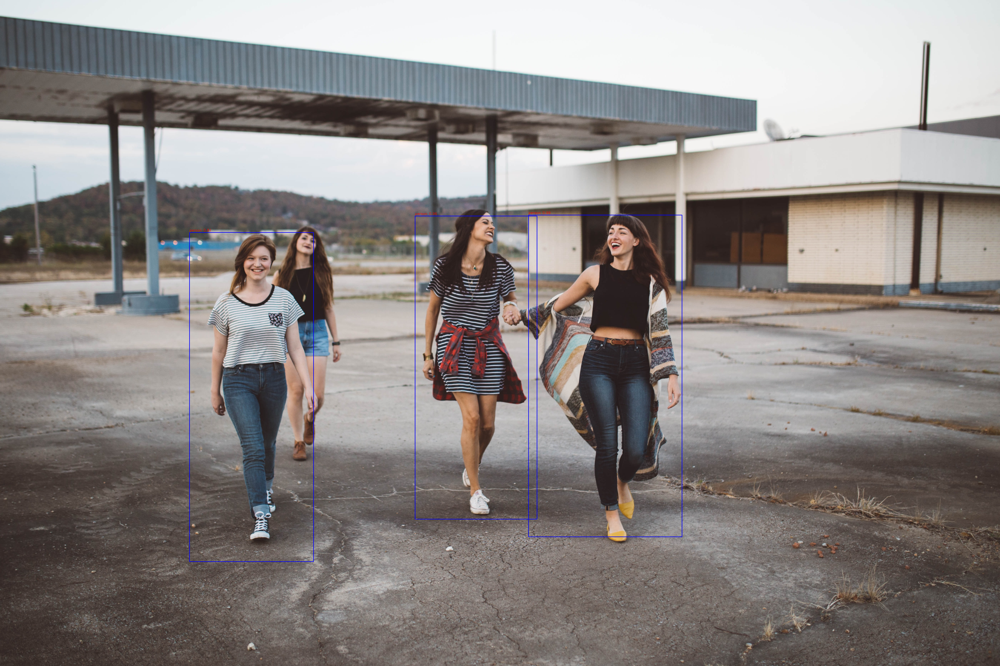

True

In [ ]:
f = input("Enter file name : ")
path = '/content/drive/My Drive/YOLO_colab/detection_tracking/images/test/'+f
image = cv2.imread(path)
image = detect_image(image, yolo, all_classes)
cv2_imshow(image)
cv2.imwrite('/content/drive/My Drive/YOLO_colab/detection_tracking/images/res/' + f, image)